In [2]:
# Importing the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyClassifier
from string import punctuation
from sklearn import svm
from itertools import chain
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn import linear_model

In [3]:
from pandas import DataFrame 
import nltk
from sklearn.neighbors import NearestNeighbors
from sklearn import neighbors
from scipy.spatial.distance import cosine
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_extraction.text import TfidfTransformer
import re
import string
#from wordcloud import WordCloud, STOPWORDS
from sklearn.metrics import mean_squared_error

In [4]:
import gzip

def parse(path):
  g = gzip.open(path, 'rb')
  for l in g:
    yield eval(l)

def getDF(path):
  i = 0
  df = {}
  for d in parse(path):
    df[i] = d
    i += 1
  return pd.DataFrame.from_dict(df, orient='index')

reviews = getDF('reviews_Home_and_Kitchen_5.json.gz')

In [6]:
reviews.to_csv('Home-and-Kitchen.csv')

In [4]:
import gzip

def parse(path):
  g = gzip.open(path, 'rb')
  for l in g:
    yield eval(l)

def getDF(path):
  i = 0
  df = {}
  for d in parse(path):
    df[i] = d
    i += 1
  return pd.DataFrame.from_dict(df, orient='index')

metadata = getDF('meta_Home_and_Kitchen.json.gz')

In [5]:
metadata.head()

,asin,salesRank,imUrl,categories,title,description,related,price,brand
0,0076144011,{'Books': 6285595},http://g-ecx.images-amazon.com/images/G/01/x-s...,[[Home & Kitchen]],"Ninjas, Piranhas, and Galileo",NaN,NaN,NaN,NaN
1,0130350591,{'Kitchen & Dining': 459680},http://ecx.images-amazon.com/images/I/21zcx6RC...,"[[Home & Kitchen, Kitchen & Dining, Dining & E...",Le Creuset Kiwi (Green) Butter Dish Stoneware,Each piece of Le Creuset dinnerware is crafted...,NaN,NaN,NaN
2,0307394530,"{'Arts, Crafts & Sewing': 3597}",http://ecx.images-amazon.com/images/I/51A4FWuj...,"[[Home & Kitchen, Artwork, Posters & Prints]]",Martha Stewart's Wedding Cakes,Of all the decisions that go into planning a w...,"{'also_bought': ['144630163X', '1402717733', '...",14.99,Random House
3,0439903491,{'Software': 7065},http://ecx.images-amazon.com/images/I/61tVxcko...,"[[Home & Kitchen, Artwork, Posters & Prints]]",NaN,Shiver me timbers! Solve I SPY pirate picture ...,"{'also_viewed': ['B000YFSZU8', 'B0016KWZB0', '...",29.99,NaN
4,0578060604,NaN,http://ecx.images-amazon.com/images/I/41aCELWJ...,"[[Home & Kitchen, Furniture, Kitchen & Dining ...",Build A Maloof Inspired Low Back Dining Chair ...,The Maloofinspired Low Back Dining Chair is no...,{'also_viewed': ['B004IO6RS8']},NaN,NaN


In [6]:
reviews.head()

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,APYOBQE6M18AA,0615391206,Martin Schwartz,"[0, 0]",My daughter wanted this book and the price on ...,5.0,Best Price,1382140800,"10 19, 2013"
1,A1JVQTAGHYOL7F,0615391206,Michelle Dinh,"[0, 0]",I bought this zoku quick pop for my daughterr ...,5.0,zoku,1403049600,"06 18, 2014"
2,A3UPYGJKZ0XTU4,0615391206,mirasreviews,"[26, 27]",There is no shortage of pop recipes available ...,4.0,"Excels at Sweet Dessert Pops, but Falls Short ...",1367712000,"05 5, 2013"
3,A2MHCTX43MIMDZ,0615391206,"M. Johnson ""Tea Lover""","[14, 18]",This book is a must have if you get a Zoku (wh...,5.0,Creative Combos,1312416000,"08 4, 2011"
4,AHAI85T5C2DH3,0615391206,PugLover,"[0, 0]",This cookbook is great. I have really enjoyed...,4.0,A must own if you own the Zoku maker...,1402099200,"06 7, 2014"


In [7]:
metadata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 436988 entries, 0 to 436987
Data columns (total 9 columns):
asin           436988 non-null object
salesRank      414167 non-null object
imUrl          436617 non-null object
categories     436988 non-null object
title          435249 non-null object
description    405793 non-null object
related        300857 non-null object
price          285168 non-null float64
brand          152611 non-null object
dtypes: float64(1), object(8)
memory usage: 20.0+ MB


In [8]:
metadata.columns[metadata.isnull().any()]

Index(['salesRank', 'imUrl', 'title', 'description', 'related', 'price',
       'brand'],
      dtype='object')

In [9]:
#missing value counts in each of these columns
miss = metadata.isnull().sum()/len(metadata)
miss = miss[miss > 0]
miss.sort_values(inplace=True)
miss

imUrl          0.000849
title          0.003980
salesRank      0.052223
description    0.071386
related        0.311521
price          0.347424
brand          0.650766
dtype: float64

In [10]:
metadata.drop_duplicates(subset=['asin'],inplace=True)
metadata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 436988 entries, 0 to 436987
Data columns (total 9 columns):
asin           436988 non-null object
salesRank      414167 non-null object
imUrl          436617 non-null object
categories     436988 non-null object
title          435249 non-null object
description    405793 non-null object
related        300857 non-null object
price          285168 non-null float64
brand          152611 non-null object
dtypes: float64(1), object(8)
memory usage: 20.0+ MB


In [11]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 551682 entries, 0 to 551681
Data columns (total 9 columns):
reviewerID        551682 non-null object
asin              551682 non-null object
reviewerName      546729 non-null object
helpful           551682 non-null object
reviewText        551682 non-null object
overall           551682 non-null float64
summary           551682 non-null object
unixReviewTime    551682 non-null int64
reviewTime        551682 non-null object
dtypes: float64(1), int64(1), object(7)
memory usage: 27.4+ MB


In [12]:
reviews.columns[reviews.isnull().any()]

Index(['reviewerName'], dtype='object')

In [13]:
#missing value counts in each of these columns
miss = reviews.isnull().sum()/len(reviews)
miss = miss[miss > 0]
miss.sort_values(inplace=True)
miss

reviewerName    0.008978
dtype: float64

In [14]:
reviews[['HelpfulnessNumerator','HelpfulnessDenominator']] = pd.DataFrame(reviews.helpful.values.tolist(), index = reviews.index)

In [15]:
reviews.drop_duplicates(subset=['reviewerID', 'asin','unixReviewTime'],inplace=True)
reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 551682 entries, 0 to 551681
Data columns (total 11 columns):
reviewerID                551682 non-null object
asin                      551682 non-null object
reviewerName              546729 non-null object
helpful                   551682 non-null object
reviewText                551682 non-null object
overall                   551682 non-null float64
summary                   551682 non-null object
unixReviewTime            551682 non-null int64
reviewTime                551682 non-null object
HelpfulnessNumerator      551682 non-null int64
HelpfulnessDenominator    551682 non-null int64
dtypes: float64(1), int64(3), object(7)
memory usage: 35.8+ MB


In [16]:
reviews

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,HelpfulnessNumerator,HelpfulnessDenominator
0,APYOBQE6M18AA,0615391206,Martin Schwartz,"[0, 0]",My daughter wanted this book and the price on ...,5.0,Best Price,1382140800,"10 19, 2013",0,0
1,A1JVQTAGHYOL7F,0615391206,Michelle Dinh,"[0, 0]",I bought this zoku quick pop for my daughterr ...,5.0,zoku,1403049600,"06 18, 2014",0,0
2,A3UPYGJKZ0XTU4,0615391206,mirasreviews,"[26, 27]",There is no shortage of pop recipes available ...,4.0,"Excels at Sweet Dessert Pops, but Falls Short ...",1367712000,"05 5, 2013",26,27
3,A2MHCTX43MIMDZ,0615391206,"M. Johnson ""Tea Lover""","[14, 18]",This book is a must have if you get a Zoku (wh...,5.0,Creative Combos,1312416000,"08 4, 2011",14,18
4,AHAI85T5C2DH3,0615391206,PugLover,"[0, 0]",This cookbook is great. I have really enjoyed...,4.0,A must own if you own the Zoku maker...,1402099200,"06 7, 2014",0,0
5,AXA9EVY6IJIZ5,0615391206,"Robin Cline ""Solarobby""","[0, 0]",If you have a Zoku Quick Pop maker (or two.......,5.0,Love it,1402099200,"06 7, 2014",0,0
6,A1SW2D234X11MS,0615391206,"savinggrace ""savinggrace""","[2, 3]",This book is so beautifully illustrated and ea...,5.0,Beautifully illustrated recipe and instruction...,1341187200,"07 2, 2012",2,3
7,A1ZH5ULI4SBO48,0615391206,"S. G. ""s.g.""","[32, 39]",I bought this when I bought the pop maker. I t...,2.0,Okay but you can figure it out yourself withou...,1323302400,"12 8, 2011",32,39
8,A1V13XAWO98C1J,0615391206,"Stan ""Stan""","[13, 13]","The Zoku accessories are pricey, but the recip...",5.0,"If you have the Zoku maker, buy this!",1316649600,"09 22, 2011",13,13
9,A3842PXNQ1QRM9,0615391206,Stephen Brem,"[0, 0]",High quality book. Clear and helpful informati...,5.0,Satisfaction opinion,1401580800,"06 1, 2014",0,0


In [26]:
#separate variables into new data frames
numeric_data = reviews.select_dtypes(include=[np.number])
cat_data = reviews.select_dtypes(exclude=[np.number])
print ("There are {} numeric and {} categorical columns in train data".format(numeric_data.shape[1],cat_data.shape[1]))

There are 6 numeric and 8 categorical columns in train data


In [18]:
del cat_data['helpful']
cat_data.describe()

,reviewerID,asin,reviewerName,reviewText,summary,reviewTime
count,551682,551682,546729,551682,551682,551682
unique,66519,28237,58902,551332,388665,4805
top,A1IU7S4HCK1XK0,B00006JSUA,Amazon Customer,,Great,"01 7, 2014"
freq,277,1064,7136,216,1979,1295


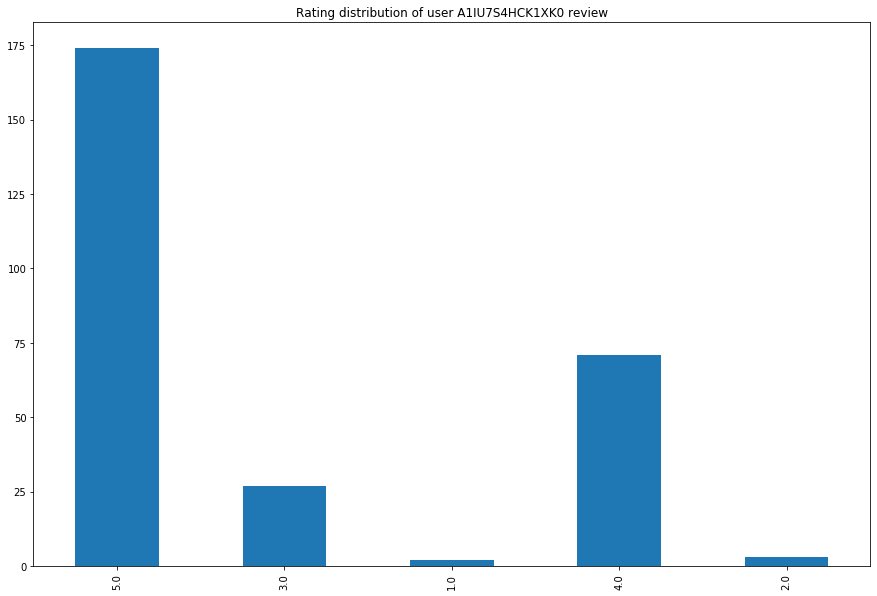

In [19]:
def plot_user(reviewerID):
    df_1user = reviews[reviews['reviewerID'] == reviewerID]['overall']
    df_1user_plot = df_1user.value_counts(sort=False)
    ax = df_1user_plot.plot(kind = 'bar', figsize = (15,10), title = 'Rating distribution of user {} review'.format(reviews[reviews['reviewerID'] == reviewerID]['reviewerID'].iloc[0]))
    plt.show()

plot_user('A1IU7S4HCK1XK0')

In [20]:
#Adding the helpfulness and upvote percentages for metrics
reviews['Helpful %'] = np.where(reviews['HelpfulnessDenominator'] > 0, reviews['HelpfulnessNumerator'] / reviews['HelpfulnessDenominator'], -1)
reviews['% Upvote'] = pd.cut(reviews['Helpful %'], bins = [-1, 0, 0.2, 0.4, 0.6, 0.8, 1.0], labels = ['Empty', '0-20%', '20-40%', '40-60%', '60-80%', '80-100%'], include_lowest = True)
reviews['Id'] = reviews.index;
reviews

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,HelpfulnessNumerator,HelpfulnessDenominator,Helpful %,% Upvote,Id
0,APYOBQE6M18AA,0615391206,Martin Schwartz,"[0, 0]",My daughter wanted this book and the price on ...,5.0,Best Price,1382140800,"10 19, 2013",0,0,-1.000000,Empty,0
1,A1JVQTAGHYOL7F,0615391206,Michelle Dinh,"[0, 0]",I bought this zoku quick pop for my daughterr ...,5.0,zoku,1403049600,"06 18, 2014",0,0,-1.000000,Empty,1
2,A3UPYGJKZ0XTU4,0615391206,mirasreviews,"[26, 27]",There is no shortage of pop recipes available ...,4.0,"Excels at Sweet Dessert Pops, but Falls Short ...",1367712000,"05 5, 2013",26,27,0.962963,80-100%,2
3,A2MHCTX43MIMDZ,0615391206,"M. Johnson ""Tea Lover""","[14, 18]",This book is a must have if you get a Zoku (wh...,5.0,Creative Combos,1312416000,"08 4, 2011",14,18,0.777778,60-80%,3
4,AHAI85T5C2DH3,0615391206,PugLover,"[0, 0]",This cookbook is great. I have really enjoyed...,4.0,A must own if you own the Zoku maker...,1402099200,"06 7, 2014",0,0,-1.000000,Empty,4
5,AXA9EVY6IJIZ5,0615391206,"Robin Cline ""Solarobby""","[0, 0]",If you have a Zoku Quick Pop maker (or two.......,5.0,Love it,1402099200,"06 7, 2014",0,0,-1.000000,Empty,5
6,A1SW2D234X11MS,0615391206,"savinggrace ""savinggrace""","[2, 3]",This book is so beautifully illustrated and ea...,5.0,Beautifully illustrated recipe and instruction...,1341187200,"07 2, 2012",2,3,0.666667,60-80%,6
7,A1ZH5ULI4SBO48,0615391206,"S. G. ""s.g.""","[32, 39]",I bought this when I bought the pop maker. I t...,2.0,Okay but you can figure it out yourself withou...,1323302400,"12 8, 2011",32,39,0.820513,80-100%,7
8,A1V13XAWO98C1J,0615391206,"Stan ""Stan""","[13, 13]","The Zoku accessories are pricey, but the recip...",5.0,"If you have the Zoku maker, buy this!",1316649600,"09 22, 2011",13,13,1.000000,80-100%,8
9,A3842PXNQ1QRM9,0615391206,Stephen Brem,"[0, 0]",High quality book. Clear and helpful informati...,5.0,Satisfaction opinion,1401580800,"06 1, 2014",0,0,-1.000000,Empty,9


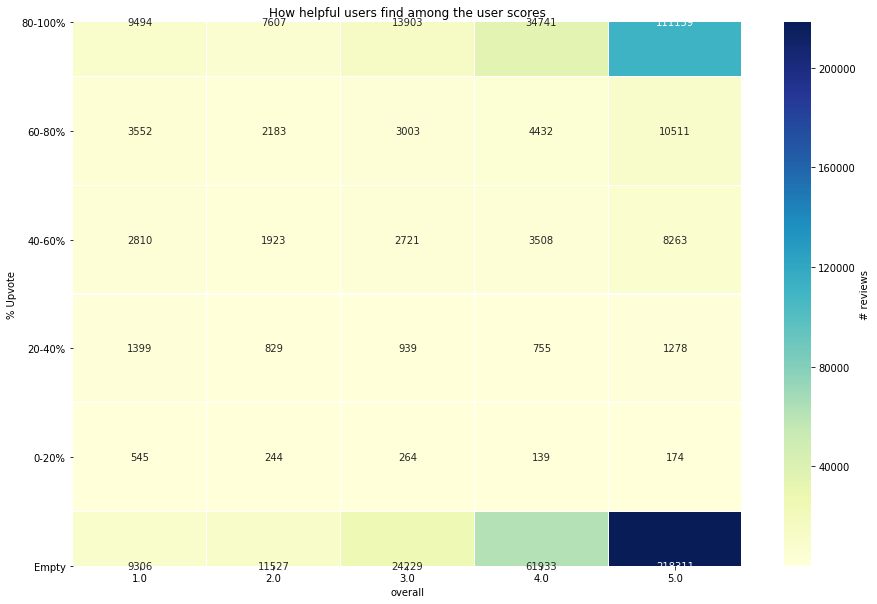

In [21]:
df_s = reviews.groupby(['overall', '% Upvote']).agg({'Id': 'count'})
df_s = df_s.unstack()
df_s.columns = df_s.columns.get_level_values(1)
fig = plt.figure(figsize=(15,10))

sns.heatmap(df_s[df_s.columns[::-1]].T, cmap = 'YlGnBu', linewidths=.5, annot = True, fmt = 'd', cbar_kws={'label': '# reviews'})
plt.yticks(rotation=0)
plt.title('How helpful users find among the user scores')
plt.show()

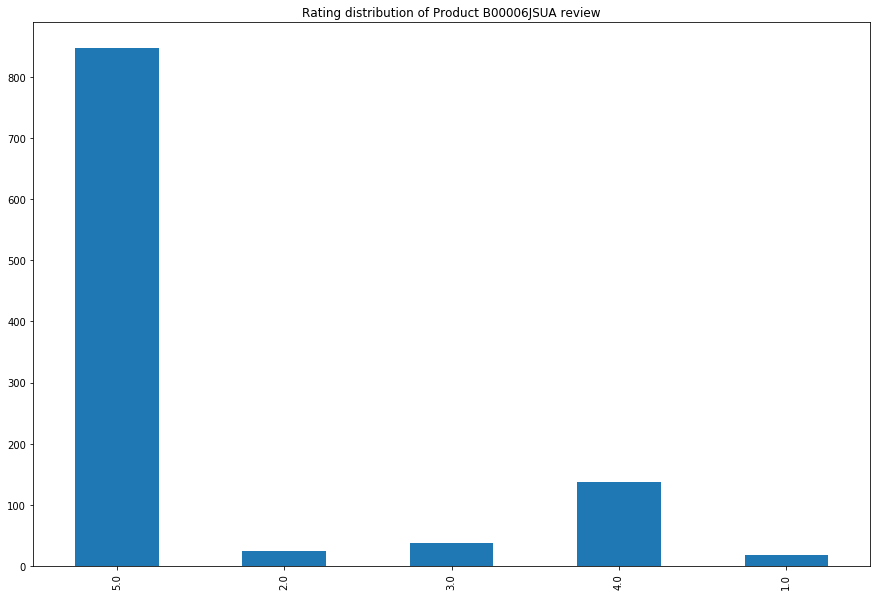

In [22]:
def plot_product(asin):
    df_1prod = reviews[reviews['asin'] == asin]['overall']
    df_1prod_plot = df_1prod.value_counts(sort=False)
    ax = df_1prod_plot.plot(kind = 'bar', figsize = (15,10), title = 'Rating distribution of Product {} review'.format(reviews[reviews['asin'] == asin]['asin'].iloc[0]))
    plt.show()
plot_product('B00006JSUA')

In [23]:
df_user = reviews.groupby(['reviewerID']).agg({'overall':['count', 'mean']})
df_user.columns = df_user.columns.get_level_values(1)
df_user.columns = ['Rating count', 'Rating mean']
df_user = df_user.sort_values(by = 'Rating count', ascending = False)
print(df_user.head(50))

                Rating count  Rating mean
reviewerID                               
A1IU7S4HCK1XK0           277     4.487365
A25C2M3QF9G7OQ           227     4.497797
A2ZY49IDE6TY5I           216     4.259259
A2NYK9KWFMJV4Y           184     4.956522
A1W415JP5WEAJK           177     4.531073
A3EPHBMU07LZ50           170     4.341176
A3AZI828WJN1CD           168     4.494048
A17V9XL4CWTQ6G           164     4.560976
AXO4PQU0XG3TG            149     3.557047
A1ODOGXEYECQQ8           144     4.166667
A23GFTVIETX7DS           142     4.366197
A3OTHWG8LLCLMU           138     4.637681
A22CW0ZHY3NJH8           136     4.514706
AY3XPKRAMKKY7            136     4.544118
AT53ZTTO707MB            129     4.263566
A3OXHLG6DIBRW8           129     4.465116
A1UQBFCERIP7VJ           128     4.796875
A2A9X58G2GTBLP           126     4.674603
A3963R7EPE3A7E           125     4.704000
A1TPW86OHXTXFC           123     4.154472
A37MH7ICH80QOX           122     4.598361
A132ETQPMHQ585           121     4

In [24]:
print(df_user[(df_user['Rating mean']<3.5) & (df_user['Rating mean']>2.5)].head())

                Rating count  Rating mean
reviewerID                               
A2Q8GFSEUSGJ51            62     3.177419
A1WOMXOEX90ARI            61     3.442623
A2DQQUEPK53ORW            57     3.438596
ABMQTSJL33EDH             50     3.260000
A33ZYFE8XMKKR1            42     3.095238


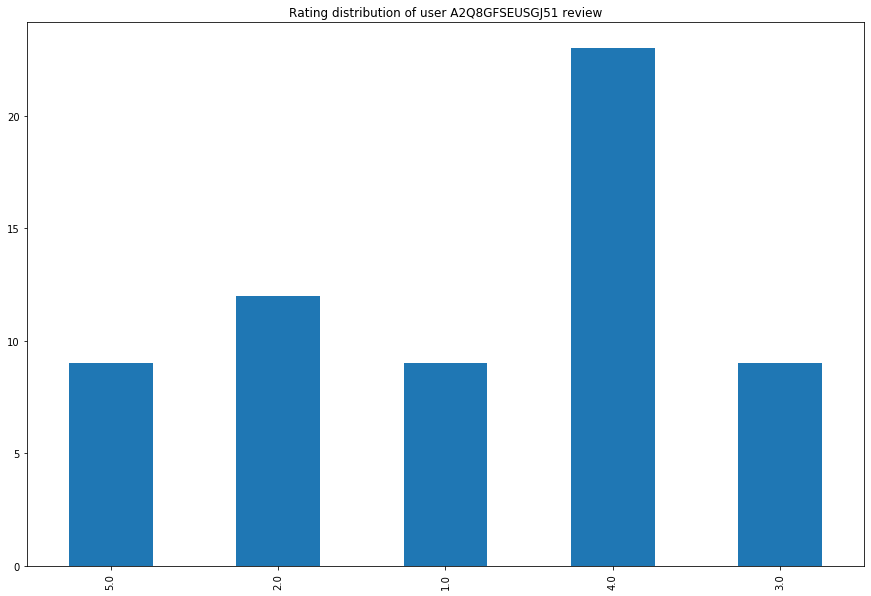

In [25]:
plot_user('A2Q8GFSEUSGJ51')

In [27]:
print(df_user[(df_user['Rating mean']<2.5)].head())

                Rating count  Rating mean
reviewerID                               
AJQFNOFTZ7GOX             24     2.250000
AG1OL1K3SFURN             18     2.444444
A2IKWNR2917XOA            17     2.411765
AOWZQAE1TO0IA             17     2.058824
AMDH9WZHBLCDB             17     1.588235


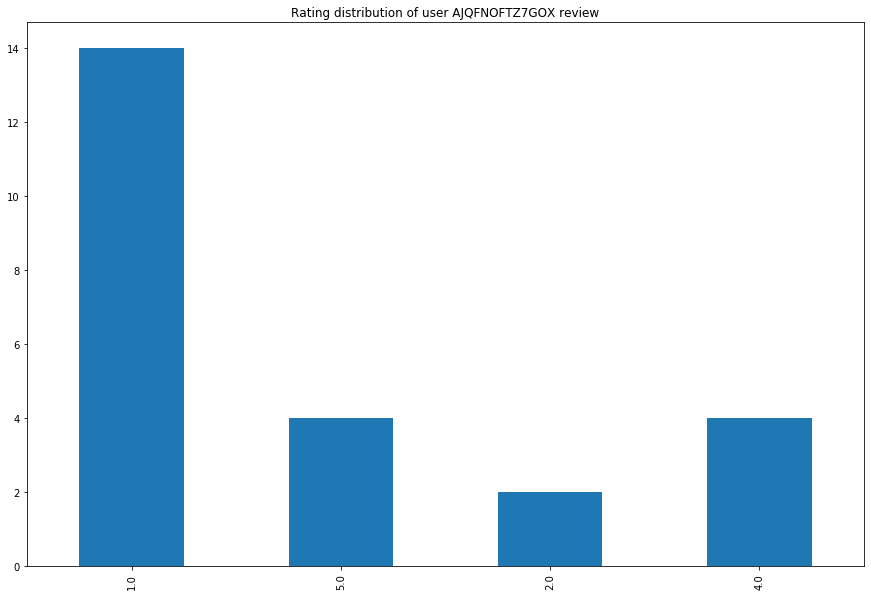

In [28]:
plot_user('AJQFNOFTZ7GOX')

In [29]:
y = reviews['asin'].unique()
len(y)

28237

*** Rating distribution ***
5.0    349696
4.0    105508
3.0     45059
1.0     27106
2.0     24313
Name: overall, dtype: int64


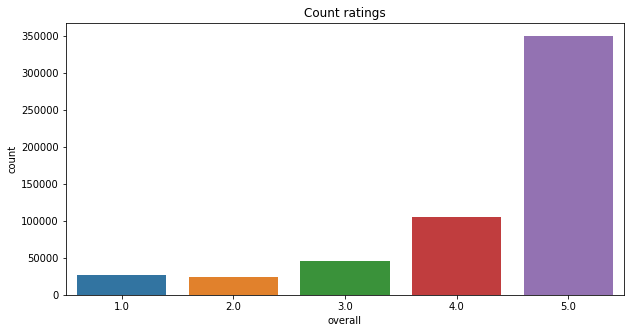

In [30]:
plt.figure(figsize=(10,5))
sns.countplot(reviews['overall'])
plt.title('Count ratings')

star = reviews.overall.value_counts()
print("*** Rating distribution ***")
print(star)
star.sort_index(inplace=True)

plt.show()

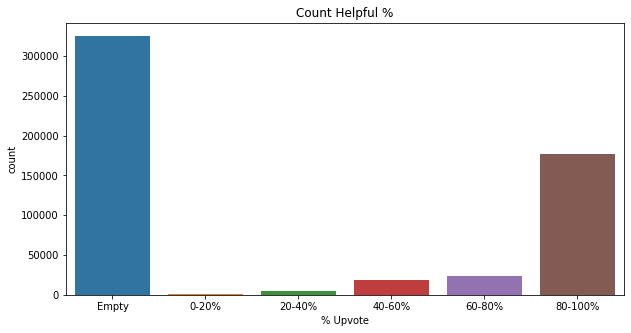

In [31]:
plt.figure(figsize=(10,5))
sns.countplot(reviews['% Upvote'])
plt.title('Count Helpful %')
plt.show()

In [32]:
rating_perperson=reviews.reviewerID.value_counts()
print ("Total ratings : " + str(sum(rating_perperson)))
print ("Total users : " + str(len(rating_perperson)))
print("Users giving bulk ratings (more than 10) : " + str(sum(rating_perperson >10)))
print("Users giving bulk ratings (more than 50) : " + str(sum(rating_perperson >50)))
print("Users giving bulk ratings (more than 100) : " + str(sum(rating_perperson >100)))
print("Users giving bulk ratings (more than 200) : " + str(sum(rating_perperson >200)))

Total ratings : 551682
Total users : 66519
Users giving bulk ratings (more than 10) : 10915
Users giving bulk ratings (more than 50) : 272
Users giving bulk ratings (more than 100) : 34
Users giving bulk ratings (more than 200) : 3


In [33]:
bulk = rating_perperson[rating_perperson >20]
bulk_rating = sum(bulk)
print ("Bulk ratings : " + str(bulk_rating))
print ("Populations of bulk ratings : " + str(bulk_rating*100/sum(rating_perperson)))
print ("Populations of bulk users : " + str(sum(rating_perperson >10)*100/len(rating_perperson)))

Bulk ratings : 80912
Populations of bulk ratings : 14.66642014783879
Populations of bulk users : 16.40884559298847


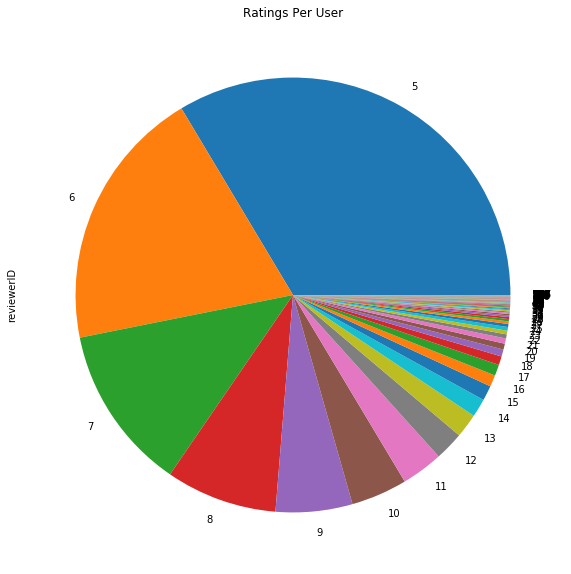

In [34]:
rating_perperson.value_counts().plot(kind='pie',figsize=(10,10), title='Ratings Per User')

In [35]:
#Net Promoters Score helps us evaluate customer satisfaction and loyalty
#Rating 1,2,3 - Detractors
#Rating 4 - Passive
#Rating 5 - Promoters
#NPS = (Promoters - Detractors)/Total ratings * 100

NPS_score = round (100*((star.loc[5])-sum(star.loc[1:3]))/sum(star.loc[:]),2)
print (" NPS score of Amazon is : "  + str(NPS_score))

 NPS score of Amazon is : 45.9


In [36]:
prod = reviews[reviews.asin=='B001N07KUE']
prod.isnull().sum()

reviewerID                0
asin                      0
reviewerName              1
helpful                   0
reviewText                0
overall                   0
summary                   0
unixReviewTime            0
reviewTime                0
HelpfulnessNumerator      0
HelpfulnessDenominator    0
Helpful %                 0
% Upvote                  0
Id                        0
dtype: int64

 NPS score of Product is : 76.66


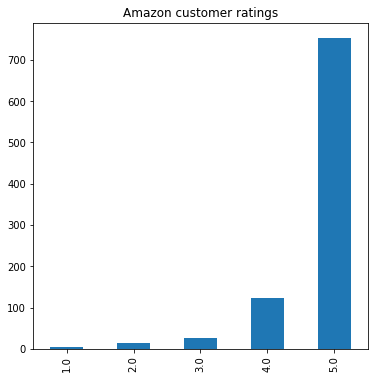

In [37]:
prod_s = prod.overall.value_counts()
prod_s.sort_index(inplace=True)

prod_NPS_score = round(100*(prod_s.loc[5]-sum(prod_s.loc[1:3]))/sum(prod_s),2)
print (" NPS score of Product is : "  + str(prod_NPS_score))

prod_s.plot(kind='bar',title='Amazon customer ratings',figsize=(6,6),style='Solarize_Light2')

In [38]:
df_prod = reviews.groupby(['asin']).agg({'overall':['count', 'mean']})
df_prod.columns = df_prod.columns.get_level_values(1)
df_prod.columns = ['Rating count', 'Rating mean']
df_prod = df_prod.sort_values(by = 'Rating count', ascending = False)
print(df_prod.head(50))

            Rating count  Rating mean
asin                                 
B00006JSUA          1064     4.664474
B001N07KUE           921     4.739414
B00006IUWA           662     4.359517
B00005B8K5           656     4.612805
B000QFDNP8           634     4.441640
B0006HUYGM           612     4.359477
B00009R66F           608     4.246711
B00004SPEU           592     4.515203
B0000CFMZN           572     4.594406
B000M8YMEU           550     4.587273
B00005IBX9           536     4.136194
B002YD99Y4           505     4.281188
B000TKDQ5C           482     4.317427
B004412GTO           478     4.288703
B000EGA6QI           478     4.564854
B00065L6CU           468     4.119658
B00004SPZV           449     3.855234
B000GXZ2GS           439     4.574032
B001T4ZAX8           437     4.457666
B001L5TVGW           432     4.530093
B000N4WMUE           418     4.648325
B00005MF9C           417     4.227818
B000638D32           412     4.725728
B00004OCO9           412     4.526699
B000DLB2FI  

In [39]:
prod['% Upvote'].value_counts()

Empty      800
80-100%    105
60-80%       7
40-60%       7
20-40%       1
0-20%        1
Name: % Upvote, dtype: int64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x540A8070>,
      dtype=object)

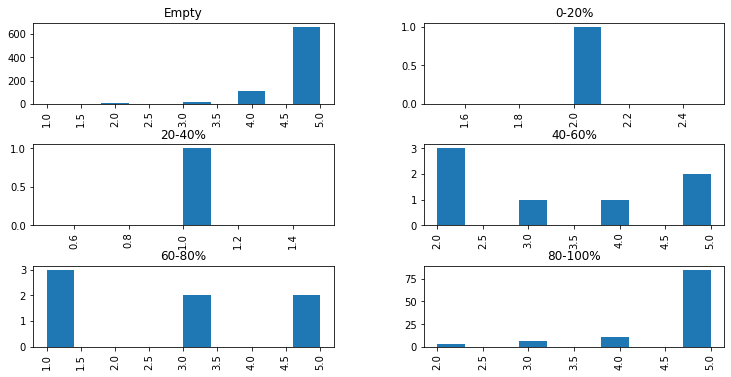

In [40]:
prod.overall.hist(by=prod["% Upvote"],figsize=(12,6))

In [17]:
dfMerged = pd.merge(reviews,metadata,how='inner',on=['asin'])

In [18]:
dfMerged

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,HelpfulnessNumerator,HelpfulnessDenominator,salesRank,imUrl,categories,title,description,related,price,brand
0,APYOBQE6M18AA,0615391206,Martin Schwartz,"[0, 0]",My daughter wanted this book and the price on ...,5.0,Best Price,1382140800,"10 19, 2013",0,0,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku
1,A1JVQTAGHYOL7F,0615391206,Michelle Dinh,"[0, 0]",I bought this zoku quick pop for my daughterr ...,5.0,zoku,1403049600,"06 18, 2014",0,0,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku
2,A3UPYGJKZ0XTU4,0615391206,mirasreviews,"[26, 27]",There is no shortage of pop recipes available ...,4.0,"Excels at Sweet Dessert Pops, but Falls Short ...",1367712000,"05 5, 2013",26,27,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku
3,A2MHCTX43MIMDZ,0615391206,"M. Johnson ""Tea Lover""","[14, 18]",This book is a must have if you get a Zoku (wh...,5.0,Creative Combos,1312416000,"08 4, 2011",14,18,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku
4,AHAI85T5C2DH3,0615391206,PugLover,"[0, 0]",This cookbook is great. I have really enjoyed...,4.0,A must own if you own the Zoku maker...,1402099200,"06 7, 2014",0,0,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku
5,AXA9EVY6IJIZ5,0615391206,"Robin Cline ""Solarobby""","[0, 0]",If you have a Zoku Quick Pop maker (or two.......,5.0,Love it,1402099200,"06 7, 2014",0,0,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku
6,A1SW2D234X11MS,0615391206,"savinggrace ""savinggrace""","[2, 3]",This book is so beautifully illustrated and ea...,5.0,Beautifully illustrated recipe and instruction...,1341187200,"07 2, 2012",2,3,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku
7,A1ZH5ULI4SBO48,0615391206,"S. G. ""s.g.""","[32, 39]",I bought this when I bought the pop maker. I t...,2.0,Okay but you can figure it out yourself withou...,1323302400,"12 8, 2011",32,39,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku
8,A1V13XAWO98C1J,0615391206,"Stan ""Stan""","[13, 13]","The Zoku accessories are pricey, but the recip...",5.0,"If you have the Zoku maker, buy this!",1316649600,"09 22, 2011",13,13,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dini

In [19]:
dfMerged.loc[dfMerged['asin']=='0689027818']

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,HelpfulnessNumerator,HelpfulnessDenominator,salesRank,imUrl,categories,title,description,related,price,brand
11,A3R9X003XW0LNR,0689027818,"Deborah Verlen ""Deborah""","[0, 0]",This beautifully illustrated book featuring te...,5.0,A sweet book for babies and toddlers,1248652800,"07 27, 2009",0,0,{'Home &amp; Kitchen': 1017975},http://ecx.images-amazon.com/images/I/51B0H32D...,[[Home & Kitchen]],"Good Night, Sweet Butterflies: A Color Dreamland",KIDS BOOK ON BUTTERFLIES,"{'also_viewed': ['1581170912', '0399226907']}",473.68,NaN
12,AMZSUGQIAOH5O,0689027818,jesssibs,"[0, 0]",I got this as a gift for my niece and she love...,5.0,Super cute niece present,1339027200,"06 7, 2012",0,0,{'Home &amp; Kitchen': 1017975},http://ecx.images-amazon.com/images/I/51B0H32D...,[[Home & Kitchen]],"Good Night, Sweet Butterflies: A Color Dreamland",KIDS BOOK ON BUTTERFLIES,"{'also_viewed': ['1581170912', '0399226907']}",473.68,NaN
13,A14BTJRH9VNLJJ,0689027818,Kurt A. Johnson,"[1, 2]",This is the story of a group of butterflies lo...,5.0,My little one absolutely loved this book,1365206400,"04 6, 2013",1,2,{'Home &amp; Kitchen': 1017975},http://ecx.images-amazon.com/images/I/51B0H32D...,[[Home & Kitchen]],"Good Night, Sweet Butterflies: A Color Dreamland",KIDS BOOK ON BUTTERFLIES,"{'also_viewed': ['1581170912', '0399226907']}",473.68,NaN
14,A307YFSORUAXSQ,0689027818,NYCPickyMom,"[16, 16]",This book is absolutely beautiful. A brilliant...,5.0,My Daughter's New Favorite,1045785600,"02 21, 2003",16,16,{'Home &amp; Kitchen': 1017975},http://ecx.images-amazon.com/images/I/51B0H32D...,[[Home & Kitchen]],"Good Night, Sweet Butterflies: A Color Dreamland",KIDS BOOK ON BUTTERFLIES,"{'also_viewed': ['1581170912', '0399226907']}",473.68,NaN
15,A2WNXS3CNAQS01,0689027818,Sapere Aude,"[1, 1]",My daughter 1 year old really likes this book....,5.0,My daughter loves it,1082592000,"04 22, 2004",1,1,{'Home &amp; Kitchen': 1017975},http://ecx.images-amazon.com/images/I/51B0H32D...,[[Home & Kitchen]],"Good Night, Sweet Butterflies: A Color Dreamland",KIDS BOOK ON BUTTERFLIES,"{'also_viewed': ['1581170912', '0399226907']}",473.68,NaN


In [20]:
dfProductReview = dfMerged[['asin',"title","categories","brand","salesRank","price","related"]]

In [21]:
dfProductReview

,asin,title,categories,brand,salesRank,price,related
0,0615391206,Zoku Quick Pops Recipe Book,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku,{'Kitchen & Dining': 3900},17.29,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '..."
1,0615391206,Zoku Quick Pops Recipe Book,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku,{'Kitchen & Dining': 3900},17.29,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '..."
2,0615391206,Zoku Quick Pops Recipe Book,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku,{'Kitchen & Dining': 3900},17.29,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '..."
3,0615391206,Zoku Quick Pops Recipe Book,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku,{'Kitchen & Dining': 3900},17.29,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '..."
4,0615391206,Zoku Quick Pops Recipe Book,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku,{'Kitchen & Dining': 3900},17.29,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '..."
5,0615391206,Zoku Quick Pops Recipe Book,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku,{'Kitchen & Dining': 3900},17.29,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '..."
6,0615391206,Zoku Quick Pops Recipe Book,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku,{'Kitchen & Dining': 3900},17.29,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '..."
7,0615391206,Zoku Quick Pops Recipe Book,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku,{'Kitchen & Dining': 3900},17.29,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '..."
8,0615391206,Zoku Quick Pops Recipe Book,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku,{'Kitchen & Dining': 3900},17.29,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '..."
9,0615391206,Zoku Quick Pops Recipe Book,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku,{'Kitchen & Dining': 3900},17.29,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '..."


In [22]:
dfProductReview.drop_duplicates(subset=['asin'],inplace=True)
dfProductReview.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28237 entries, 0 to 551673
Data columns (total 7 columns):
asin          28237 non-null object
title         28130 non-null object
categories    28237 non-null object
brand         19414 non-null object
salesRank     27194 non-null object
price         24265 non-null float64
related       27230 non-null object
dtypes: float64(1), object(6)
memory usage: 1.1+ MB


c:\users\juyee\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [28]:
mean = reviews.groupby("asin", as_index=False).mean()

In [29]:
#missing value counts in each of these columns
miss = mean.isnull().sum()/len(mean)
miss = miss[miss > 0]
miss.sort_values(inplace=True)
miss

Series([], dtype: float64)

In [31]:
#del mean['unixReviewTime']
#del mean['Id']
del mean['HelpfulnessNumerator']
del mean['HelpfulnessDenominator']

In [32]:
mean

,asin,overall
0,0615391206,4.454545
1,0689027818,5.000000
2,0912696591,4.548387
3,1223070743,4.250000
4,1567120709,4.062500
5,1891747401,4.400000
6,1983475912,4.166667
7,2042037265,4.333333
8,7213035835,4.714286
9,7502151168,4.700000


In [33]:
ProductReview = pd.merge(mean,dfProductReview,on="asin",how='inner')
ProductReview

,asin,overall,title,categories,brand,salesRank,price,related
0,0615391206,4.454545,Zoku Quick Pops Recipe Book,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku,{'Kitchen & Dining': 3900},17.29,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '..."
1,0689027818,5.000000,"Good Night, Sweet Butterflies: A Color Dreamland",[[Home & Kitchen]],NaN,{'Home &amp; Kitchen': 1017975},473.68,"{'also_viewed': ['1581170912', '0399226907']}"
2,0912696591,4.548387,Wilton Decorating Cakes Book,"[[Home & Kitchen, Kitchen & Dining, Bakeware, ...",Wilton,{'Kitchen & Dining': 9690},14.26,"{'also_bought': ['B003MC22TU', 'B003MC22PY', '..."
3,1223070743,4.250000,Vandor 52423 Star Wars Large Recycled Shopper ...,"[[Home & Kitchen, Kitchen & Dining, Storage & ...",Vandor,{'Kitchen & Dining': 5754},2.95,"{'also_bought': ['B0034IYV4Q', 'B00I56N01W', '..."
4,1567120709,4.062500,Franklin SPELLING CORRECTOR,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Franklin Electronics,NaN,27.95,"{'also_bought': ['B000XQ6T74', 'B0002OP83I', '..."
5,1891747401,4.400000,Mighty Bright Fold-n-Stow Book Holder,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Mighty Bright LED Light Deluxe Gift Set,{'Kitchen & Dining': 1315},7.86,"{'also_bought': ['B00006B8HT', 'B001B0TXEW', '..."
6,1983475912,4.166667,Best Choice 2013 Design Fist Cup Brass Knuckle...,"[[Home & Kitchen, Kitchen & Dining, Dining & E...",new brand,{'Kitchen & Dining': 7247},12.39,"{'also_bought': ['B002MUBWVM', 'B004MZNMY0', '..."
7,2042037265,4.333333,World Pride Mickey Mouse Face Shape Cookie Cutter,"[[Home & Kitchen, Kitchen & Dining, Bakeware, ...",World Pride,{'Kitchen & Dining': 7770},1.44,"{'also_bought': ['B00CKIM3WS', 'B0057YQ2LK', '..."
8,7213035835,4.714286,Tupperware Fresh &amp; Pure Ice Tray Purple Se...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",NaN,{'Kitchen & Dining': 95129},39.99,"{'also_bought': ['B004SIEPXI', 'B004RUGHJW', '..."
9,7502151168,4.700000,Tupperware Orange Citrus Peeler Set of 6,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Tupperware,{'Kitchen & Dining': 20542},9.99,"{'also_bought': ['B005UUVTVY', 'B00GGD8GHE', '..."


In [34]:
yy = ProductReview['title'].unique()
len(yy)

28058

In [35]:
ProductReview.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28237 entries, 0 to 28236
Data columns (total 8 columns):
asin          28237 non-null object
overall       28237 non-null float64
title         28130 non-null object
categories    28237 non-null object
brand         19414 non-null object
salesRank     27194 non-null object
price         24265 non-null float64
related       27230 non-null object
dtypes: float64(2), object(6)
memory usage: 1.3+ MB


In [36]:
highestRatings = ProductReview[ProductReview.overall >= 4.5]
highestRatings.reset_index(inplace=True)
del highestRatings['index']
highestRatings

,asin,overall,title,categories,brand,salesRank,price,related
0,0689027818,5.000000,"Good Night, Sweet Butterflies: A Color Dreamland",[[Home & Kitchen]],NaN,{'Home &amp; Kitchen': 1017975},473.68,"{'also_viewed': ['1581170912', '0399226907']}"
1,0912696591,4.548387,Wilton Decorating Cakes Book,"[[Home & Kitchen, Kitchen & Dining, Bakeware, ...",Wilton,{'Kitchen & Dining': 9690},14.26,"{'also_bought': ['B003MC22TU', 'B003MC22PY', '..."
2,7213035835,4.714286,Tupperware Fresh &amp; Pure Ice Tray Purple Se...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",NaN,{'Kitchen & Dining': 95129},39.99,"{'also_bought': ['B004SIEPXI', 'B004RUGHJW', '..."
3,7502151168,4.700000,Tupperware Orange Citrus Peeler Set of 6,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Tupperware,{'Kitchen & Dining': 20542},9.99,"{'also_bought': ['B005UUVTVY', 'B00GGD8GHE', '..."
4,7535549756,5.000000,Tupperware Smidgets in Pink and Red Set of 5,"[[Home & Kitchen, Kitchen & Dining, Storage & ...",Tupperware,{'Home &amp; Kitchen': 537363},14.95,"{'also_bought': ['B008C4QVDQ', 'B0002IQ1OE', '..."
5,7802215811,4.750000,Tupperware Large Pick a Deli Container,"[[Home & Kitchen, Kitchen & Dining, Storage & ...",Tupperware Deli Keeper,{'Home &amp; Kitchen': 62916},17.95,"{'also_bought': ['B00C9S6DXO', 'B003DGLC6E', '..."
6,9178894395,4.684211,"IKEA - KALAS Tumbler, Assorted Colors (2 Sets)","[[Home & Kitchen, Kitchen & Dining, Dining & E...",KALAS Tumbler,{'Kitchen & Dining': 1107},5.72,"{'also_bought': ['917889669X', '9178896681', '..."
7,B00002255K,5.000000,Incra PROTRAC06 6-Inch Precision Marking Protr...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Incra,NaN,27.95,"{'also_bought': ['B00004TRBX', 'B0000DD2U8', '..."
8,B00002N5ZB,4.631579,Lasko 3300 Wind Machine,"[[Home & Kitchen, Heating, Cooling & Air Quali...",Lasko,{'Home &amp; Kitchen': 725},32.17,"{'also_bought': ['B001R1Q0OG', 'B000HHJ2I2', '..."
9,B00002N5ZP,4.500000,Mirro 92180A Polished Aluminum Dishwasher Safe...,"[[Home & Kitchen, Kitchen & Dining, Cookware, ...",T-fal,{'Kitchen & Dining': 23166},44.90,"{'also_bought': ['B001D1I4WG', 'B000U7QEXK', '..."


In [37]:
ProductReview.describe()

,overall,price
count,28237.000000,24265.000000
mean,4.273257,45.703435
std,0.535210,75.499160
min,1.000000,0.010000
25%,4.000000,10.720000
50%,4.375000,19.990000
75%,4.666667,44.990000
max,5.000000,999.990000


In [38]:
ProductReview["sentiment"] = ProductReview["overall"]>=4
ProductReview["sentiment"] = ProductReview["sentiment"].replace([True , False] , ["pos" , "neg"])

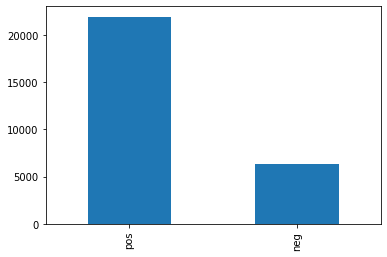

In [39]:
ProductReview["sentiment"].value_counts().plot.bar()

In [40]:
ProductReview['brand'].value_counts()

Norpro                                            430
OXO                                               365
Cuisinart                                         356
Wilton                                            299
InterDesign                                       225
KitchenAid                                        214
Fox Run                                           203
RSVP                                              189
Hamilton Beach                                    171
Rubbermaid                                        165
Household Essentials                              142
Nordic Ware                                       137
Calphalon                                         135
Whitmor                                           128
Oster                                             122
Black &amp; Decker                                111
Progressive International                         110
Spectrum                                          108
Farberware                  

In [41]:
count = dfMerged.groupby("asin", as_index=False).count()

In [42]:
actualCount = count[['asin','reviewerID']]
actualCount['totalReviewers']=actualCount["reviewerID"]
actualCount

c:\users\juyee\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,asin,reviewerID,totalReviewers
0,0615391206,11,11
1,0689027818,5,5
2,0912696591,93,93
3,1223070743,8,8
4,1567120709,16,16
5,1891747401,15,15
6,1983475912,6,6
7,2042037265,6,6
8,7213035835,7,7
9,7502151168,10,10


In [43]:
del actualCount['reviewerID']

In [44]:
Merged = pd.merge(dfMerged, actualCount, how='right', on='asin')
Merged

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,HelpfulnessNumerator,HelpfulnessDenominator,salesRank,imUrl,categories,title,description,related,price,brand,totalReviewers
0,APYOBQE6M18AA,0615391206,Martin Schwartz,"[0, 0]",My daughter wanted this book and the price on ...,5.0,Best Price,1382140800,"10 19, 2013",0,0,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku,11
1,A1JVQTAGHYOL7F,0615391206,Michelle Dinh,"[0, 0]",I bought this zoku quick pop for my daughterr ...,5.0,zoku,1403049600,"06 18, 2014",0,0,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku,11
2,A3UPYGJKZ0XTU4,0615391206,mirasreviews,"[26, 27]",There is no shortage of pop recipes available ...,4.0,"Excels at Sweet Dessert Pops, but Falls Short ...",1367712000,"05 5, 2013",26,27,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku,11
3,A2MHCTX43MIMDZ,0615391206,"M. Johnson ""Tea Lover""","[14, 18]",This book is a must have if you get a Zoku (wh...,5.0,Creative Combos,1312416000,"08 4, 2011",14,18,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku,11
4,AHAI85T5C2DH3,0615391206,PugLover,"[0, 0]",This cookbook is great. I have really enjoyed...,4.0,A must own if you own the Zoku maker...,1402099200,"06 7, 2014",0,0,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku,11
5,AXA9EVY6IJIZ5,0615391206,"Robin Cline ""Solarobby""","[0, 0]",If you have a Zoku Quick Pop maker (or two.......,5.0,Love it,1402099200,"06 7, 2014",0,0,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku,11
6,A1SW2D234X11MS,0615391206,"savinggrace ""savinggrace""","[2, 3]",This book is so beautifully illustrated and ea...,5.0,Beautifully illustrated recipe and instruction...,1341187200,"07 2, 2012",2,3,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku,11
7,A1ZH5ULI4SBO48,0615391206,"S. G. ""s.g.""","[32, 39]",I bought this when I bought the pop maker. I t...,2.0,Okay but you can figure it out yourself withou...,1323302400,"12 8, 2011",32,39,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhiqv...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku Quick Pops Recipe Book,This book will help you master the art of crea...,"{'also_bought': ['B004G7W8BW', 'B004KS5BQ6', '...",17.29,Zoku,11
8,A1V13XAWO98C1J,0615391206,"Stan ""Stan""","[13, 13]","The Zoku accessories are pricey, but the recip...",5.0,"If you have the Zoku maker, buy this!",1316649600,"09 22, 2011",13,13,{'Kitchen & Dining': 3900},http://ecx.images-amazon.com/images/I/41EEhi

In [50]:
Merged = Merged.sort_values(by='totalReviewers', ascending=False)

MemoryError: 

In [51]:
dfCount = Merged[Merged.totalReviewers >= 100]
dfCount

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,HelpfulnessNumerator,HelpfulnessDenominator,salesRank,imUrl,categories,title,description,related,price,brand,totalReviewers
346,A2AXWQVA5V9GPJ,B00000JGRT,A. Benenson,"[0, 0]","Worked great for the first year we had it, whe...",2.0,Cooling capability wears out fast,1374969600,"07 28, 2013",0,0,{'Kitchen & Dining': 6359},http://ecx.images-amazon.com/images/I/41FRS3FB...,"[[Home & Kitchen, Kitchen & Dining, Small Appl...",Cuisinart ICE-20 Automatic 1-1/2-Quart Ice Cre...,"Automatic dessert maker makes frozen yogurt, i...","{'also_bought': ['B00004S9D3', '0894803123', '...",62.99,Cuisinart,211
347,A3CSGQ1OWIO8E1,B00000JGRT,Aidan Sonoda,"[2, 2]",Assuming one has realistic expectations from s...,5.0,An excellent maker for the value minded.,1232323200,"01 19, 2009",2,2,{'Kitchen & Dining': 6359},http://ecx.images-amazon.com/images/I/41FRS3FB...,"[[Home & Kitchen, Kitchen & Dining, Small Appl...",Cuisinart ICE-20 Automatic 1-1/2-Quart Ice Cre...,"Automatic dessert maker makes frozen yogurt, i...","{'also_bought': ['B00004S9D3', '0894803123', '...",62.99,Cuisinart,211
348,A3TLUNUYP4VOX1,B00000JGRT,A. Jobin,"[2, 2]",I received this as a wedding gift and like it ...,5.0,fun for special occasions,1094256000,"09 4, 2004",2,2,{'Kitchen & Dining': 6359},http://ecx.images-amazon.com/images/I/41FRS3FB...,"[[Home & Kitchen, Kitchen & Dining, Small Appl...",Cuisinart ICE-20 Automatic 1-1/2-Quart Ice Cre...,"Automatic dessert maker makes frozen yogurt, i...","{'also_bought': ['B00004S9D3', '0894803123', '...",62.99,Cuisinart,211
349,ATBJPI0EIPAMJ,B00000JGRT,AllisonSmith,"[1, 1]",Just saw this at Costco in Chicago for about 1...,5.0,Go to COSTCO,1337472000,"05 20, 2012",1,1,{'Kitchen & Dining': 6359},http://ecx.images-amazon.com/images/I/41FRS3FB...,"[[Home & Kitchen, Kitchen & Dining, Small Appl...",Cuisinart ICE-20 Automatic 1-1/2-Quart Ice Cre...,"Automatic dessert maker makes frozen yogurt, i...","{'also_bought': ['B00004S9D3', '0894803123', '...",62.99,Cuisinart,211
350,A1115ST6F5CWYP,B00000JGRT,Amalfi Coast Girl,"[29, 33]",I have had one of these for about 10 years. I...,4.0,good for a first ice cream machine,1148256000,"05 22, 2006",29,33,{'Kitchen & Dining': 6359},http://ecx.images-amazon.com/images/I/41FRS3FB...,"[[Home & Kitchen, Kitchen & Dining, Small Appl...",Cuisinart ICE-20 Automatic 1-1/2-Quart Ice Cre...,"Automatic dessert maker makes frozen yogurt, i...","{'also_bought': ['B00004S9D3', '0894803123', '...",62.99,Cuisinart,211
351,A2EBT03DMBBXSR,B00000JGRT,Amazon Buyer,"[14, 14]",My first three batches of ice cream from this ...,5.0,Ice cream maker gives outstanding bang for the...,1184284800,"07 13, 2007",14,14,{'Kitchen & Dining': 6359},http://ecx.images-amazon.com/images/I/41FRS3FB...,"[[Home & Kitchen, Kitchen & Dining, Small Appl...",Cuisinart ICE-20 Automatic 1-1/2-Quart Ice Cre...,"Automatic dessert maker makes frozen yogurt, i...","{'also_bought': ['B00004S9D3', '0894803123', '...",62.99,Cuisinart,211
352,A156TMZD408SDG,B00000JGRT,Amy Blaine,"[1, 1]",I really wanted to love this ice cream maker. ...,2.0,Hard Around the Bowl,1353456000,"11 21, 2012",1,1,{'Kitchen & Dining': 6359},http://ecx.images-amazon.com/images/I/41FRS3FB...,"[[Home & Kitchen, Kitchen & Dining, Small Appl...",Cuisinart ICE-20 Automatic 1-1/2-Quart Ice Cre...,"Automatic dessert maker makes frozen yogurt, i...","{'also_bought': ['B00004S9D3', '0894803123', '...",62.99,Cuisinart,211
353,A2UGCWC46V7PPG,B00000JGRT,"Andy Baird ""-------""","[27, 36]",Works very well--but [at the price]? Come on! ...,2.0,"Good product, bad price",964396800,"07 24, 2000",27,36,{'Kitchen & Dining': 6359},http://ecx.images-amazon.com/images/I/41FRS3FB...,"[[Home & Kitchen, Kitchen & Dining, Small Appl...",Cuisinart ICE-20 Automatic 1-1/2-Quart Ice Cre...,"Automatic dessert maker makes frozen yogurt, i...","{'also_bought': ['B00004S9D3', '0894803123', '...",62.99,Cuisinart,211
354,AV3NBS1L977

In [52]:
ProductReviewSummary = dfCount.groupby("asin")["summary"].apply(list)
ProductReviewSummary = pd.DataFrame(ProductReviewSummary)
ProductReviewSummary.to_csv("ProductReviewSummary.csv")

In [53]:
df3 = pd.read_csv("ProductReviewSummary.csv")
df3 = pd.merge(df3, ProductReview, on="asin", how='inner')
df3

,asin,summary,overall,title,categories,brand,salesRank,price,related,sentiment
0,B00000JGRT,"['Cooling capability wears out fast', 'An exce...",4.473934,Cuisinart ICE-20 Automatic 1-1/2-Quart Ice Cre...,"[[Home & Kitchen, Kitchen & Dining, Small Appl...",Cuisinart,{'Kitchen & Dining': 6359},62.99,"{'also_bought': ['B00004S9D3', '0894803123', '...",pos
1,B00002N602,"['works perfect', ""Cheap pressure cooker didn'...",4.563107,Presto 01341 4-Quart Stainless Steel Pressure...,"[[Home & Kitchen, Kitchen & Dining, Cookware, ...",Presto,{'Kitchen & Dining': 2938},51.79,"{'also_bought': ['B000ORD8GM', '0965410803', '...",pos
2,B00002N8CX,"['Hose Easily Kinks', 'She says it works great...",4.284768,Eureka 3670G Mighty Mite Canister Vacuum,"[[Home & Kitchen, Vacuums & Floor Care, Vacuum...",Eureka,{'Home &amp; Kitchen': 160},69.99,"{'also_bought': ['B0006OLFUO', 'B0007XVVB2', '...",pos
3,B00004OCIP,"[""Better than my mother's!"", 'Sharp Peeler', '...",4.707182,OXO Good Grips Swivel Peeler,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,NaN,8.80,"{'also_bought': ['B000SSTV8Q', 'B0071OUJDQ', '...",pos
4,B00004OCJQ,"['Potato ricer', 'i like it', 'Nice Qualtiy, g...",4.427184,OXO Good Grips Potato Ricer,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,{'Kitchen & Dining': 1551},24.99,"{'also_bought': ['B0019R7SPS', 'B00004OCNJ', '...",pos
5,B00004OCK0,['One of the most useful tools in the kitchen'...,4.804469,OXO Good Grips 9-Inch Stainless Steel Locking ...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,{'Kitchen & Dining': 2694},7.20,"{'also_bought': ['B0000CDVD8', 'B0001BMXIU', '...",pos
6,B00004OCKR,"['My new favorite kitchen tool!', 'Fantastic M...",4.634761,OXO Good Grips Salad Spinner,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,{'Kitchen & Dining': 224},29.95,"{'also_bought': ['B002MQ3SOA', 'B002DWA6K2', '...",pos
7,B00004OCL2,"['Love clean vegetables', 'Comfortable to use ...",4.734463,OXO Good Grips Flexible Vegetable Brush,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,{'Home &amp; Kitchen': 662},4.99,"{'also_bought': ['B00004OCIZ', 'B00004OCLJ', '...",pos
8,B00004OCLW,"['Worth the price', 'Worked well, maybe too we...",4.776000,OXO Good Grips 6-Inch Double Rod Strainer,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,{'Kitchen & Dining': 4860},15.22,"{'also_bought': ['B001713L84', 'B00KY4Z1I8', '...",pos
9,B00004OCMM,"['Excellent!', 'Effortless', 'Best one I have ...",4.669456,OXO SteeL Can Opener,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,{'Kitchen & Dining': 1128},18.95,"{'also_bought': ['B0001YH1A2', 'B00004OCIP', '...",pos


In [1]:
regEx = re.compile('[^a-z]+')
def cleanReviews(reviewText):
    reviewText = reviewText.lower()
    reviewText = regEx.sub(' ', reviewText).strip()
    return reviewText

NameError: name 're' is not defined

In [55]:
df3["summaryClean"] = df3["summary"].apply(cleanReviews)
df3 = df3.drop_duplicates(['overall'], keep='last')
df3 = df3.reset_index()
df3

,index,asin,summary,overall,title,categories,brand,salesRank,price,related,sentiment,summaryClean
0,0,B00000JGRT,"['Cooling capability wears out fast', 'An exce...",4.473934,Cuisinart ICE-20 Automatic 1-1/2-Quart Ice Cre...,"[[Home & Kitchen, Kitchen & Dining, Small Appl...",Cuisinart,{'Kitchen & Dining': 6359},62.99,"{'also_bought': ['B00004S9D3', '0894803123', '...",pos,cooling capability wears out fast an excellent...
1,1,B00002N602,"['works perfect', ""Cheap pressure cooker didn'...",4.563107,Presto 01341 4-Quart Stainless Steel Pressure...,"[[Home & Kitchen, Kitchen & Dining, Cookware, ...",Presto,{'Kitchen & Dining': 2938},51.79,"{'also_bought': ['B000ORD8GM', '0965410803', '...",pos,works perfect cheap pressure cooker didn t las...
2,2,B00002N8CX,"['Hose Easily Kinks', 'She says it works great...",4.284768,Eureka 3670G Mighty Mite Canister Vacuum,"[[Home & Kitchen, Vacuums & Floor Care, Vacuum...",Eureka,{'Home &amp; Kitchen': 160},69.99,"{'also_bought': ['B0006OLFUO', 'B0007XVVB2', '...",pos,hose easily kinks she says it works great is l...
3,3,B00004OCIP,"[""Better than my mother's!"", 'Sharp Peeler', '...",4.707182,OXO Good Grips Swivel Peeler,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,NaN,8.80,"{'also_bought': ['B000SSTV8Q', 'B0071OUJDQ', '...",pos,better than my mother s sharp peeler food gets...
4,5,B00004OCK0,['One of the most useful tools in the kitchen'...,4.804469,OXO Good Grips 9-Inch Stainless Steel Locking ...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,{'Kitchen & Dining': 2694},7.20,"{'also_bought': ['B0000CDVD8', 'B0001BMXIU', '...",pos,one of the most useful tools in the kitchen qu...
5,6,B00004OCKR,"['My new favorite kitchen tool!', 'Fantastic M...",4.634761,OXO Good Grips Salad Spinner,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,{'Kitchen & Dining': 224},29.95,"{'also_bought': ['B002MQ3SOA', 'B002DWA6K2', '...",pos,my new favorite kitchen tool fantastic macine ...
6,7,B00004OCL2,"['Love clean vegetables', 'Comfortable to use ...",4.734463,OXO Good Grips Flexible Vegetable Brush,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,{'Home &amp; Kitchen': 662},4.99,"{'also_bought': ['B00004OCIZ', 'B00004OCLJ', '...",pos,love clean vegetables comfortable to use and g...
7,8,B00004OCLW,"['Worth the price', 'Worked well, maybe too we...",4.776000,OXO Good Grips 6-Inch Double Rod Strainer,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,{'Kitchen & Dining': 4860},15.22,"{'also_bought': ['B001713L84', 'B00KY4Z1I8', '...",pos,worth the price worked well maybe too well doe...
8,9,B00004OCMM,"['Excellent!', 'Effortless', 'Best one I have ...",4.669456,OXO SteeL Can Opener,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,{'Kitchen & Dining': 1128},18.95,"{'also_bought': ['B0001YH1A2', 'B00004OCIP', '...",pos,excellent effortless best one i have ever owne...
9,10,B00004OCNE,"['why settle for just one spatula', ""Good ol' ...",4.654930,"OXO Good Grips Medium Silicone Spatula, Tomato","[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",OXO,{'Kitchen & Dining': 100142},9.99,"{'also_bought': ['B000QJGRJ8', 'B007638GOQ', '...",pos,why settle for just one spatula good ol oxo gr...


In [56]:
reviews = df3["summaryClean"] 
countVector = CountVectorizer(max_features = 300, stop_words='english') 
transformedReviews = countVector.fit_transform(reviews) 

dfReviews = DataFrame(transformedReviews.A, columns=countVector.get_feature_names())
dfReviews = dfReviews.astype(int)

In [57]:
dfReviews.to_csv("dfReviews.csv")
dfReviews

,absolutely,accurate,addition,advertised,air,amazing,amazon,appliance,attractive,awesome,...,wonderful,work,worked,working,works,worth,wow,year,years,yes
0,0,0,0,0,1,0,0,1,0,0,...,4,3,0,1,12,1,3,0,1,0
1,2,0,2,0,0,1,0,1,0,1,...,4,0,0,0,9,1,0,0,2,0
2,0,0,0,1,0,0,1,0,0,2,...,1,0,0,1,2,0,2,0,1,0
3,1,0,0,0,0,1,0,0,0,0,...,1,1,0,0,9,0,0,0,0,0
4,1,0,2,0,0,0,0,0,0,2,...,1,5,0,0,3,1,0,0,4,0
5,1,0,1,1,0,0,0,1,0,2,...,4,1,0,1,32,6,0,0,9,3
6,0,1,0,0,0,0,0,0,0,0,...,2,0,0,0,15,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,4,2,0,0,0,0
8,0,0,0,0,0,1,0,0,1,2,...,1,3,0,1,18,4,1,2,1,0
9,0,0,0,0,0,0,0,0,0,1,...,2,2,0,0,1,1,0,1,0,0


In [58]:
X = np.array(dfReviews)
 # create train and test
tpercent = 0.9
tsize = int(np.floor(tpercent * len(dfReviews)))
dfReviews_train = X[:tsize]
dfReviews_test = X[tsize:]
#len of train and test
lentrain = len(dfReviews_train)
lentest = len(dfReviews_test)

dfReviews_test

array([[1, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 0],
       [0, 0, 0, ..., 1, 0, 0],
       ...,
       [1, 0, 1, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [59]:
print(lentrain)
print(lentest)

555
62


In [60]:
neighbor = NearestNeighbors(n_neighbors=3, algorithm='ball_tree').fit(dfReviews_train)

# Let's find the k-neighbors of each point in object X. To do that we call the kneighbors() function on object X.
distances, indices = neighbor.kneighbors(dfReviews_train)

In [61]:
for i in range(lentest):
    a = neighbor.kneighbors([dfReviews_test[i]])
    related_product_list = a[1]

    first_related_product = [item[0] for item in related_product_list]
    first_related_product = str(first_related_product).strip('[]')
    first_related_product = int(first_related_product)
    second_related_product = [item[1] for item in related_product_list]
    second_related_product = str(second_related_product).strip('[]')
    second_related_product = int(second_related_product)
    
    print ("Based on product reviews, for ", df3["asin"][lentrain + i],"--->",df3["title"][lentrain + i]," average rating is ",df3["overall"][lentrain + i])
    print ("The first similar product is ", df3["asin"][first_related_product] ,"--->",df3["title"][first_related_product]," average rating is ",df3["overall"][first_related_product])
    print ("The second similar product is ", df3["asin"][second_related_product] ,"--->",df3["title"][second_related_product]," average rating is ",df3["overall"][second_related_product])
    print ("-----------------------------------------------------------")
    
    

Based on product reviews, for  B00608YG7E ---> Lamma Loe Supreme 1500 Series 4pc Bed Sheet Set - 100% Manufacturer Guaranteed - Full (Double), Royal Blue, 1 Flat Sheet, 1 Fitted Sheet, 2 Pillowcases, Deep Pockets Fits 16&quot; Mattress - Available in Many Sizes and Colors  average rating is  4.022222222222222
The first similar product is  B003H2GMIW ---> Anili Mili's Triple Stitch Embroidery Affordable 4 PC Bed Sheet Set - King Size, Navy Blue  average rating is  4.162790697674419
The second similar product is  B003IVU03K ---> Clara Clark Complete 7 Piece Bed Sheet and Duvet Cover Set, Cal King Size, White  average rating is  3.988095238095238
-----------------------------------------------------------
Based on product reviews, for  B00629K4YK ---> Artisan (2 pk.) Non-Stick Silicone Baking Mat Set, 16 5/8&quot; x 11  average rating is  4.744604316546763
The first similar product is  B00008T960 ---> Silpat Non-Stick Baking Mat, 11 5/8 x 16 1/2-inches, Half Sheet Size  average rating is 

Based on product reviews, for  B008X3KQ0U ---> Tovolo 12 Inch Silicone Spatula Set, Summer Sky - Set of 3  average rating is  4.5
The first similar product is  B0037NZ5ES ---> Lipper International 826 Set of 6 Bamboo Kitchen Tools, in Mesh Bag  average rating is  4.366412213740458
The second similar product is  B0007XXSF4 ---> Corelle Livingware Winter Frost White 3-Piece Serve Set  average rating is  4.846153846153846
-----------------------------------------------------------
Based on product reviews, for  B0091YYUAM ---> BISSELL Powerfresh Steam Mop, White, 1940  average rating is  4.506912442396313
The first similar product is  B0028MB3HM ---> Shark Steam Pocket Mop (S3501)  average rating is  3.6666666666666665
The second similar product is  B000RPVHZU ---> Bissell Steam Mop Hard-Floor Cleaner, Green Tea, 1867-7  average rating is  3.7196969696969697
-----------------------------------------------------------
Based on product reviews, for  B009GCXETW ---> Mind Reader &quot;Anchor&

In [62]:
df5_train_target = df3["overall"][:lentrain]
df5_test_target = df3["overall"][lentrain:lentrain+lentest]
df5_train_target = df5_train_target.astype(int)
df5_test_target = df5_test_target.astype(int)

n_neighbors = 3
knnclf = neighbors.KNeighborsClassifier(n_neighbors, weights='distance')
knnclf.fit(dfReviews_train, df5_train_target)
knnpreds_test = knnclf.predict(dfReviews_test)

print(classification_report(df5_test_target, knnpreds_test))

              precision    recall  f1-score   support

           3       0.17      0.20      0.18         5
           4       0.93      0.91      0.92        57

    accuracy                           0.85        62
   macro avg       0.55      0.56      0.55        62
weighted avg       0.87      0.85      0.86        62



In [63]:
print (accuracy_score(df5_test_target, knnpreds_test))

0.8548387096774194


In [64]:
print(mean_squared_error(df5_test_target, knnpreds_test))

0.14516129032258066


In [66]:
from sklearn.metrics import precision_recall_fscore_support as score
precision, recall, fscore , support = score(df5_test_target, knnpreds_test,average='binary')
print('Precision: {} / Recall :{} / Accuracy {} '.format(round(precision,3),
                                                         round(recall,3),
                                                         round((y_pred==y_test).sum()/len(y_test),3)))

ValueError: pos_label=1 is not a valid label: array([3, 4])

In [76]:
ProductReview.related[2]

{'also_bought': ['B003MC22TU',
  'B003MC22PY',
  'B006UKNSVC',
  'B003MC22Z4',
  'B000OSFIN2',
  '0470380098',
  'B004BQ3GEG',
  'B00C4NYSSQ',
  '1589236696',
  'B002BUNR7A',
  '1934089567',
  'B0002ZFXSW',
  'B0002ZFXSM',
  '0715338374',
  '1402717733',
  'B00006G92Y',
  'B000FH0RRO',
  'B0009NZOJK',
  'B003X0BTZ4',
  'B004EBVLBS',
  'B0000CFMQS',
  '1592536514',
  'B007E8KESO',
  '0778804771',
  'B0089VBJOI',
  '1446303985',
  'B005BPTUBY',
  'B0050B1IRS',
  'B007E8KCEU',
  'B00C1ML0Y0',
  '1934089133',
  'B0000CFN0Y',
  'B007E8KCJA',
  'B007E8KCFY',
  'B0008DI9XY',
  '0912696362',
  '144630163X',
  'B003W1WZK2',
  'B0016BPTSU',
  'B0000CFMP2',
  'B003LMY6JA',
  'B0000CFMLT',
  '0930113101',
  'B00175RMF8',
  'B0000VM4VC',
  '0912696044',
  '145491016X',
  'B000PBZHOS',
  'B001BOELLI',
  'B003LN6AJ8',
  'B00175TFJE',
  '1600611680',
  'B0001XXBFM',
  'B002N7LGDI',
  'B0000DE12F',
  'B007E8KCCM',
  'B0029YDR82',
  'B0000VM46M',
  'B0000CFMXD',
  'B0000VMBQU',
  'B007E8KDF8',
  'B00004

In [59]:
ProdReview = ProductReview.dropna(subset=['related'],inplace=False)

In [60]:
ProdReview = ProdReview.reset_index()

In [63]:
ProdReview

,asin,overall,Helpful %,title,categories,brand,salesRank,price,related,sentiment
0,0615391206,4.454545,0.020720,Zoku Quick Pops Recipe Book,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Zoku,{'Kitchen & Dining': 3900},17.29,"{'bought_together': ['B004G7W8BW', 'B003U9ZCRO...",pos
1,0689027818,5.000000,0.100000,"Good Night, Sweet Butterflies: A Color Dreamland",[[Home & Kitchen]],NaN,{'Home &amp; Kitchen': 1017975},473.68,"{'also_viewed': ['1581170912', '0399226907']}",pos
2,0912696591,4.548387,-0.318471,Wilton Decorating Cakes Book,"[[Home & Kitchen, Kitchen & Dining, Bakeware, ...",Wilton,{'Kitchen & Dining': 9690},14.26,"{'bought_together': ['B003MC22TU', 'B006UKNSVC...",pos
3,1223070743,4.250000,-1.000000,Vandor 52423 Star Wars Large Recycled Shopper ...,"[[Home & Kitchen, Kitchen & Dining, Storage & ...",Vandor,{'Kitchen & Dining': 5754},2.95,"{'bought_together': ['B0034IYV4Q', 'B004SLBYWU...",pos
4,1567120709,4.062500,-0.330295,Franklin SPELLING CORRECTOR,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Franklin Electronics,NaN,27.95,"{'also_bought': ['B000XQ6T74', 'B0002OP83I', '...",pos
5,1891747401,4.400000,-0.500000,Mighty Bright Fold-n-Stow Book Holder,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Mighty Bright LED Light Deluxe Gift Set,{'Kitchen & Dining': 1315},7.86,"{'bought_together': ['B00006B8HT', 'B005IV6U0U...",pos
6,1983475912,4.166667,-1.000000,Best Choice 2013 Design Fist Cup Brass Knuckle...,"[[Home & Kitchen, Kitchen & Dining, Dining & E...",new brand,{'Kitchen & Dining': 7247},12.39,"{'bought_together': ['B004MZNMY0', 'B004N016CO...",pos
7,2042037265,4.333333,-1.000000,World Pride Mickey Mouse Face Shape Cookie Cutter,"[[Home & Kitchen, Kitchen & Dining, Bakeware, ...",World Pride,{'Kitchen & Dining': 7770},1.44,"{'bought_together': ['B00A6Z5DK6'], 'also_boug...",pos
8,7213035835,4.714286,0.142857,Tupperware Fresh &amp; Pure Ice Tray Purple Se...,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",NaN,{'Kitchen & Dining': 95129},39.99,"{'bought_together': ['B004SIEPXI', 'B007U256D2...",pos
9,7502151168,4.700000,-0.400000,Tupperware Orange Citrus Peeler Set of 6,"[[Home & Kitchen, Kitchen & Dining, Kitchen Ut...",Tupperware,{'Kitchen & Dining': 20542},9.99,"{'bought_together': ['B005UUVTVY', 'B002XOHZWC...",pos


In [62]:
del ProdReview['index']

In [64]:
transactions=[]


for unique_id,item in zip(ProdReview.asin,ProdReview.related):
    trans = []
    trans.append(unique_id)
    if "also_bought" in item.keys():
        for i in item['also_bought']:
            trans.append(i)
    transactions.append(trans)
        

In [65]:
print(transactions)

[['0615391206', 'B004G7W8BW', 'B004KS5BQ6', 'B003U9ZCRO', 'B003VJWUE6', 'B006Y265DY', 'B00560V6SE', 'B00560V77Y', 'B00CDNWP32', 'B00CDL3920', 'B00CDNWTLU', '0988315815', 'B00CDL3538', 'B006Y25AWG', 'B00CDL32L8', '1594742537', '1612430651', 'B00CDL33Q2', 'B006Y1X5CE', 'B006Y24L8A', '1250004268', 'B00EVHFK7Q', 'B004QTP6NC', 'B00DEOB06M', 'B00EVHRYIE', 'B00I3JWXZA', 'B00EVI2YJC', 'B00CDL36JQ', '1607740354', '1452101922', 'B00FDS3YIY', '160774211X', 'B006Y22W0Y', 'B006Y23ZAA', 'B00ELCDOW4', '1416206256', 'B00CD0LHXE', '0471753092', 'B00J9471SW', 'B00EDHE4ZI', 'B00856QB2C', 'B000G32H3Y', 'B00EV6BINC', 'B000G34F1Q', 'B000MMKPEC', '0811877825', 'B00CE1PQDE', 'B00D9HQ30W', '1617690996', 'B00HJKP4XC', 'B00BFUSDO4', 'B0002IBJOG', 'B0036B9KHO'], ['0689027818'], ['0912696591', 'B003MC22TU', 'B003MC22PY', 'B006UKNSVC', 'B003MC22Z4', 'B000OSFIN2', '0470380098', 'B004BQ3GEG', 'B00C4NYSSQ', '1589236696', 'B002BUNR7A', '1934089567', 'B0002ZFXSW', 'B0002ZFXSM', '0715338374', '1402717733', 'B00006G92Y', 

In [66]:
len(transactions)

27230

In [67]:
from apyori import apriori
rules = apriori(transactions, min_support=0.0085, min_confidence=0.4, min_lift=3,min_length=3)
results = list(rules)

In [68]:
len(results)

533

In [69]:
output = []
for row in results:
    output.append([str(row.items), "support="+str(row.support), "confidence="+str(row.ordered_statistics[0].confidence), "lift="+str(row.ordered_statistics[0].lift)]) 

In [70]:
output

[["frozenset({'B00004OCNS', 'B00004OCIP'})",
  'support=0.01072346676459787',
  'confidence=0.4281524926686217',
  'lift=17.144988787303777'],
 ["frozenset({'B00004S7V8', 'B00004OCIP'})",
  'support=0.011127432978332722',
  'confidence=0.4442815249266862',
  'lift=10.510674130107443'],
 ["frozenset({'B00004SZ7H', 'B00004OCIP'})",
  'support=0.012596401028277636',
  'confidence=0.5029325513196481',
  'lift=10.502188169044492'],
 ["frozenset({'B0002ITQHS', 'B00004OCIP'})",
  'support=0.019280205655526992',
  'confidence=0.7697947214076246',
  'lift=8.825899058496681'],
 ["frozenset({'B000CBOTQ8', 'B00004OCIP'})",
  'support=0.009658464928387808',
  'confidence=0.4781818181818182',
  'lift=19.092215409224206'],
 ["frozenset({'B000M8YMEU', 'B00004OCIP'})",
  'support=0.017260374586852735',
  'confidence=0.689149560117302',
  'lift=9.336090806962256'],
 ["frozenset({'B007TUQF9O', 'B00004OCIP'})",
  'support=0.011200881380829968',
  'confidence=0.4472140762463343',
  'lift=12.632405908908385

In [71]:
apriori_summary = pd.DataFrame(columns=('Items','Support','Confidence','Lift'))

Support =[]
Confidence = []
Lift = []
Items = []

for row in results: 
    Items.append(row.items)
    Support.append(row.support)
    Confidence.append(str(row.ordered_statistics[0].confidence))
    Lift.append(row.ordered_statistics[0].lift)
    

apriori_summary['Items'] = Items                                   
apriori_summary['Support'] = Support
apriori_summary['Confidence'] = Confidence
apriori_summary['Lift']= Lift

In [72]:
apriori_summary

,Items,Support,Confidence,Lift,Title
0,"(B00004OCNS, B00004OCIP)",0.010723,0.4281524926686217,17.144989,NaN
1,"(B00004S7V8, B00004OCIP)",0.011127,0.4442815249266862,10.510674,NaN
2,"(B00004SZ7H, B00004OCIP)",0.012596,0.5029325513196481,10.502188,NaN
3,"(B0002ITQHS, B00004OCIP)",0.019280,0.7697947214076246,8.825899,NaN
4,"(B000CBOTQ8, B00004OCIP)",0.009658,0.4781818181818182,19.092215,NaN
5,"(B000M8YMEU, B00004OCIP)",0.017260,0.689149560117302,9.336091,NaN
6,"(B007TUQF9O, B00004OCIP)",0.011201,0.4472140762463343,12.632406,NaN
7,"(B00004OCNJ, B00004OCK1)",0.008740,0.4694280078895464,11.464148,NaN
8,"(B00004OCNS, B00004OCK1)",0.011201,0.601577909270217,24.089657,NaN
9,"(B00004S7V8, B00004OCK1)",0.011127,0.5976331360946746,14.138619,NaN


In [73]:
names=[]
for items in apriori_summary.Items:
    name=[]
    for unique in items:
        temp = ProductReview.loc[ProductReview['asin']==str(unique)]
        name.append(list(temp.title))
    names.append(name)

#apriori_summary['Title']==names
names

[[['OXO Good Grips 11-Inch Balloon Whisk'], ['OXO Good Grips Swivel Peeler']],
 [['Microplane 40020 Classic Zester/Grater'],
  ['OXO Good Grips Swivel Peeler']],
 [['Pyrex Prepware 3-Piece Mixing Bowl Set, Clear'],
  ['OXO Good Grips Swivel Peeler']],
 [[], ['OXO Good Grips Swivel Peeler']],
 [[], ['OXO Good Grips Swivel Peeler']],
 [['Wilton 570-1121 Easy Flex 3-Piece Silicone Spatula Set, Blue'],
  ['OXO Good Grips Swivel Peeler']],
 [['Cuisinart CTG-00-3MS Mesh Strainers, Set of 3'],
  ['OXO Good Grips Swivel Peeler']],
 [['OXO Good Grips Multi-Purpose Pastry Scraper/Chopper'], []],
 [['OXO Good Grips 11-Inch Balloon Whisk'], []],
 [['Microplane 40020 Classic Zester/Grater'], []],
 [[], []],
 [[], ["Nordic Ware Natural Aluminum Commercial Baker's Half Sheet"]],
 [['OXO Good Grips Silicone Pastry Brush'], []],
 [['Wilton 570-1121 Easy Flex 3-Piece Silicone Spatula Set, Blue'], []],
 [['OXO Good Grips 11-Inch Balloon Whisk'],
  ['OXO Good Grips Multi-Purpose Pastry Scraper/Chopper']],

In [74]:
apriori_summary

,Items,Support,Confidence,Lift,Title
0,"(B00004OCNS, B00004OCIP)",0.010723,0.4281524926686217,17.144989,NaN
1,"(B00004S7V8, B00004OCIP)",0.011127,0.4442815249266862,10.510674,NaN
2,"(B00004SZ7H, B00004OCIP)",0.012596,0.5029325513196481,10.502188,NaN
3,"(B0002ITQHS, B00004OCIP)",0.019280,0.7697947214076246,8.825899,NaN
4,"(B000CBOTQ8, B00004OCIP)",0.009658,0.4781818181818182,19.092215,NaN
5,"(B000M8YMEU, B00004OCIP)",0.017260,0.689149560117302,9.336091,NaN
6,"(B007TUQF9O, B00004OCIP)",0.011201,0.4472140762463343,12.632406,NaN
7,"(B00004OCNJ, B00004OCK1)",0.008740,0.4694280078895464,11.464148,NaN
8,"(B00004OCNS, B00004OCK1)",0.011201,0.601577909270217,24.089657,NaN
9,"(B00004S7V8, B00004OCK1)",0.011127,0.5976331360946746,14.138619,NaN


In [75]:
name_df = pd.DataFrame(names)
name_df

,0,1,2,3,4
0,[OXO Good Grips 11-Inch Balloon Whisk],[OXO Good Grips Swivel Peeler],None,None,None
1,[Microplane 40020 Classic Zester/Grater],[OXO Good Grips Swivel Peeler],None,None,None
2,"[Pyrex Prepware 3-Piece Mixing Bowl Set, Clear]",[OXO Good Grips Swivel Peeler],None,None,None
3,[],[OXO Good Grips Swivel Peeler],None,None,None
4,[],[OXO Good Grips Swivel Peeler],None,None,None
5,[Wilton 570-1121 Easy Flex 3-Piece Silicone Sp...,[OXO Good Grips Swivel Peeler],None,None,None
6,"[Cuisinart CTG-00-3MS Mesh Strainers, Set of 3]",[OXO Good Grips Swivel Peeler],None,None,None
7,[OXO Good Grips Multi-Purpose Pastry Scraper/C...,[],None,None,None
8,[OXO Good Grips 11-Inch Balloon Whisk],[],None,None,None
9,[Microplane 40020 Classic Zester/Grater],[],None,None,None


In [76]:
del apriori_summary['Title']

In [77]:
AprioriResults = pd.DataFrame.join(apriori_summary,name_df,how='left')
AprioriResults

,Items,Support,Confidence,Lift,0,1,2,3,4
0,"(B00004OCNS, B00004OCIP)",0.010723,0.4281524926686217,17.144989,[OXO Good Grips 11-Inch Balloon Whisk],[OXO Good Grips Swivel Peeler],None,None,None
1,"(B00004S7V8, B00004OCIP)",0.011127,0.4442815249266862,10.510674,[Microplane 40020 Classic Zester/Grater],[OXO Good Grips Swivel Peeler],None,None,None
2,"(B00004SZ7H, B00004OCIP)",0.012596,0.5029325513196481,10.502188,"[Pyrex Prepware 3-Piece Mixing Bowl Set, Clear]",[OXO Good Grips Swivel Peeler],None,None,None
3,"(B0002ITQHS, B00004OCIP)",0.019280,0.7697947214076246,8.825899,[],[OXO Good Grips Swivel Peeler],None,None,None
4,"(B000CBOTQ8, B00004OCIP)",0.009658,0.4781818181818182,19.092215,[],[OXO Good Grips Swivel Peeler],None,None,None
5,"(B000M8YMEU, B00004OCIP)",0.017260,0.689149560117302,9.336091,[Wilton 570-1121 Easy Flex 3-Piece Silicone Sp...,[OXO Good Grips Swivel Peeler],None,None,None
6,"(B007TUQF9O, B00004OCIP)",0.011201,0.4472140762463343,12.632406,"[Cuisinart CTG-00-3MS Mesh Strainers, Set of 3]",[OXO Good Grips Swivel Peeler],None,None,None
7,"(B00004OCNJ, B00004OCK1)",0.008740,0.4694280078895464,11.464148,[OXO Good Grips Multi-Purpose Pastry Scraper/C...,[],None,None,None
8,"(B00004OCNS, B00004OCK1)",0.011201,0.601577909270217,24.089657,[OXO Good Grips 11-Inch Balloon Whisk],[],None,None,None
9,"(B00004S7V8, B00004OCK1)",0.011127,0.5976331360946746,14.138619,[Microplane 40020 Classic Zester/Grater],[],None,None,None


In [78]:
AprioriResults.to_csv("AprioriResults.csv")

In [79]:
ClusterDf = ProductReview[["salesRank","price"]]

In [80]:
ClusterDf.dropna(subset=['salesRank','price'],inplace=True)
ClusterDf.reset_index(inplace=True)

C:\Users\juyee\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [124]:
import itertools
rank = []
ranks = []
for items in ClusterDf.salesRank:
    #print(items)
    rank.append(list(items.values()))
    
#ranks = list(itertools.chain.from_iterable(rank))
#print(rank)

In [91]:
rank = pd.DataFrame(rank)

In [95]:
len(rank)

23311

In [93]:
ClusteringResults = pd.DataFrame.join(ClusterDf,rank,how='left')

In [125]:
bought_transactions=[]


for unique_id,item in zip(ProdReview.asin,ProdReview.related):
    trans = []
    trans.append(unique_id)
    if "bought_together" in item.keys():
        for i in item['bought_together']:
            trans.append(i)
    bought_transactions.append(trans)

In [126]:
bought_transactions

[['0615391206', 'B004G7W8BW', 'B003U9ZCRO'],
 ['0689027818'],
 ['0912696591', 'B003MC22TU', 'B006UKNSVC'],
 ['1223070743', 'B0034IYV4Q', 'B004SLBYWU'],
 ['1567120709', 'B000XQ6T74'],
 ['1891747401', 'B00006B8HT', 'B005IV6U0U'],
 ['1983475912', 'B004MZNMY0', 'B004N016CO'],
 ['2042037265', 'B00A6Z5DK6'],
 ['7213035835', 'B004SIEPXI', 'B007U256D2'],
 ['7502151168', 'B005UUVTVY', 'B002XOHZWC'],
 ['7535549756', 'B0002IQ1OE'],
 ['7802215811', 'B00C9S6DXO', 'B003DGLC6E'],
 ['9177124405', 'B0000DDU2S'],
 ['9178894395', '917889669X', '9178896681'],
 ['B00000DMDJ', '0618346872'],
 ['B00000JGRP', 'B0000DDXLE', 'B0006GC7IQ'],
 ['B00000JGRQ', 'B009GQ032E', 'B001D9B2R2'],
 ['B00000JGRS'],
 ['B00000JGRT', '0894803123', 'B00EDHE4ZI'],
 ['B0000223YC', 'B001DDY6HG', 'B0000223YJ'],
 ['B00002255K', 'B00004TRBX', 'B0000DD2U8'],
 ['B00002N5FO', 'B003NVLWMI'],
 ['B00002N5Z9', 'B000065DKJ'],
 ['B00002N5ZB', 'B001R1RXUG', 'B001R1Q0OG'],
 ['B00002N5ZP', 'B001D1I4WG', 'B000U7QEXK'],
 ['B00002N5ZQ', 'B0012C5ZPK',

In [142]:
from apyori import apriori
rules2 = apriori(bought_transactions, min_support=0.0004, min_confidence=0.4, min_lift=3,min_length=3)
results2 = list(rules2)

In [143]:
len(results2)

68

In [144]:
output2 = []
for row in results2:
    output.append([str(row.items), "support="+str(row.support), "confidence="+str(row.ordered_statistics[0].confidence), "lift="+str(row.ordered_statistics[0].lift)]) 

In [147]:
apriori_summary2 = pd.DataFrame(columns=('Items','Support','Confidence'))

Support =[]
Confidence = []
#Lift = []
Items = []

for row in results2: 
    Items.append(row.items)
    Support.append(row.support)
    Confidence.append(str(row.ordered_statistics[0].confidence))
    Lift.append(row.ordered_statistics[0].lift)
    

apriori_summary2['Items'] = Items                                   
apriori_summary2['Support'] = Support
apriori_summary2['Confidence'] = Confidence
#apriori_summary2['Lift']= Lift

In [148]:
apriori_summary2

,Items,Support,Confidence
0,"(1934193798, 0764597264)",0.000477,0.4333333333333333
1,"(0778801810, 1616084731)",0.000477,0.5909090909090908
2,"(B00578EKRY, 1412778638)",0.000477,0.619047619047619
3,"(B001BB2LMM, 155832156X)",0.000698,0.48717948717948717
4,"(B004LZG2N4, 155832156X)",0.000441,1.0
5,"(B000IYYFIQ, B00004OCNJ)",0.000477,0.6842105263157895
6,"(B000QJE48O, B00004OCNJ)",0.000441,0.7999999999999999
7,"(B0013BKDO8, B00004RAGL)",0.000661,1.0
8,"(B00004UE6N, B00004RDFH)",0.000624,0.5
9,"(B00004RIZ7, B000I1ZZ24)",0.000477,1.0


In [149]:
b_names=[]
for items in apriori_summary2.Items:
    name=[]
    for unique in items:
        temp = ProductReview.loc[ProductReview['asin']==str(unique)]
        name.append(list(temp.title))
    b_names.append(name)

#apriori_summary['Title']==names
b_names

[[[], []],
 [[], []],
 [['Reynolds Metals 00504 Slow Cooker Liners 13&quot;X21&quot;, 4 LINERS'],
  []],
 [['Progressive International Adjustable Bread Keeper'], []],
 [[], []],
 [['J.K. Adams FRP-1 Maple French Rolling Pin'],
  ['OXO Good Grips Multi-Purpose Pastry Scraper/Chopper']],
 [['OXO Good Grips Dough Blender with Blades'],
  ['OXO Good Grips Multi-Purpose Pastry Scraper/Chopper']],
 [[], []],
 [['Norpro 5 1/2-Inch Stainless Steel Funnel with Detachable Strainer'],
  ['Prepworks from Progressive International GPC-2549 Vegetable/French Fry Cutter']],
 [['Progressive Stainless Steel Mesh Tea Ball'],
  ['HIC Snap Mesh Tea Ball Infuser']],
 [['Cuisinart BDH-2 Blade and Disc Holder'], ['Cuisinart DLC-DH Disc Holder']],
 [['Norpro Ravioli Maker With  Press'], ['Norpro Pasta Drying Rack']],
 [[], ['A/C Safe AC-160 Universal Heavy Duty Window Air Conditioner Support']],
 [['Nordic Ware Pro Cast Bavaria Bundt Pan'], []],
 [["Global G-2 - 8 inch, 20cm Chef's Knife"],
  ['Global GS-38 - 

In [151]:
bought_name = pd.DataFrame(b_names)

In [153]:
AprioriResults2 = pd.DataFrame.join(apriori_summary2,bought_name,how='left')
AprioriResults2

,Items,Support,Confidence,0,1
0,"(1934193798, 0764597264)",0.000477,0.4333333333333333,[],[]
1,"(0778801810, 1616084731)",0.000477,0.5909090909090908,[],[]
2,"(B00578EKRY, 1412778638)",0.000477,0.619047619047619,[Reynolds Metals 00504 Slow Cooker Liners 13&q...,[]
3,"(B001BB2LMM, 155832156X)",0.000698,0.48717948717948717,[Progressive International Adjustable Bread Ke...,[]
4,"(B004LZG2N4, 155832156X)",0.000441,1.0,[],[]
5,"(B000IYYFIQ, B00004OCNJ)",0.000477,0.6842105263157895,[J.K. Adams FRP-1 Maple French Rolling Pin],[OXO Good Grips Multi-Purpose Pastry Scraper/C...
6,"(B000QJE48O, B00004OCNJ)",0.000441,0.7999999999999999,[OXO Good Grips Dough Blender with Blades],[OXO Good Grips Multi-Purpose Pastry Scraper/C...
7,"(B0013BKDO8, B00004RAGL)",0.000661,1.0,[],[]
8,"(B00004UE6N, B00004RDFH)",0.000624,0.5,[Norpro 5 1/2-Inch Stainless Steel Funnel with...,[Prepworks from Progressive International GPC-...
9,"(B00004RIZ7, B000I1ZZ24)",0.000477,1.0,[Progressive Stainless Steel Mesh Tea Ball],[HIC Snap Mesh Tea Ball Infuser]
